<center><img src="https://cdn.pixabay.com/photo/2015/11/08/16/13/currency-1033803_1280.jpg" width="720"></center>

<center><font size=6>Economic Freedom Analysis</font></center>

# **Problem Statement**

## Context

Created in 1995 by the Heritage Foundation, The Index of Economic Freedom is a ranking created to measure the economic freedom in the countries of the world. Now, in its 25th edition, The Economic Freedom Index is poised to help readers track over two decades of the advancement in economic freedom, prosperity, and opportunity and promote these ideas in their homes, schools, and communities. The Index covers 12 freedoms, from property rights to financial freedom, in 186 countries.

## Objective

To analyze the data, use clustering algorithms to identify different groups of countries based on economic freedom, and list the insights from the analysis.

## Data Description

The data comprises factors indicating economic freedom. The list of variables in the data is given below. All these features are self-explanatory and more details can be found in the data source listed below.

- CountryID
- Country Name
- WEBNAME
- Region
- World Rank
- Region Rank
- 2019 Score
- Property Rights
- Judical Effectiveness
- Government Integrity
- Tax Burden
- Gov't Spending
- Fiscal Health
- Business Freedom
- Labor Freedom
- Monetary Freedom
- Trade Freedom
- Investment Freedom
- Financial Freedom
- Tariff Rate (%)
- Income Tax Rate (%)
- Corporate Tax Rate (%)
- Tax Burden % of GDP
- Gov't Expenditure % of GDP
- Country
- Population (Millions)
- GDP (Billions, PPP)
- GDP Growth Rate (%)
- 5 Year GDP Growth Rate (%)
- GDP per Capita (PPP)
- Unemployment (%)
- Inflation (%)
- FDI Inflow (Millions)
- Public Debt (% of GDP)

**Data Source**

This dataset belongs to The Heritage Foundation and is freely available to download on their [website](https://www.heritage.org/index).

# **Importing necessary libraries**

In [ ]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to perform PCA
from sklearn.decomposition import PCA

# to suppress warnings
import warnings

warnings.filterwarnings("ignore")

# **Loading the dataset**

In [ ]:
# loading the dataset
data = pd.read_csv("/content/economic_freedom_index2019_data.csv", encoding="latin-1")

# **Overview of the Dataset**

The initial steps to get an overview of any dataset is to:
- observe the first few rows of the dataset, to check whether the dataset has been loaded properly or not
- get information about the number of rows and columns in the dataset
- find out the data types of the columns to ensure that data is stored in the preferred format and the value of each property is as expected.
- check the statistical summary of the dataset to get an overview of the numerical columns of the data

## Displaying first 5 and last 5 rows of the dataset

In [ ]:
# viewing the first 5 rows of the data
data.head()

,CountryID,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Country,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,1,Afghanistan,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,Afghanistan,35.5,$69.6,2.5,2.9,"$1,958",8.8,5.0,53.9,7.3
1,2,Albania,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,Albania,2.9,$36.0,3.9,2.5,"$12,507",13.9,2.0,"1,119.1",71.2
2,3,Algeria,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,Algeria,41.5,$632.9,2.0,3.1,"$15,237",10.0,5.6,"1,203.0",25.8
3,4,Angola,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,Angola,28.2,$190.3,0.7,2.9,"$6,753",8.2,31.7,"-2,254.5",65.3
4,5,Argentina,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,Argentina,44.1,$920.2,2.9,0.7,"$20,876",8.7,25.7,"11,857.0",52.6


In [ ]:
data.tail()

,CountryID,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Country,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
181,179,Venezuela,Venezuela,Americas,179.0,32.0,25.9,7.6,13.1,7.9,74.7,58.1,17.6,33.9,28.0,0.0,60.0,0.0,10.0,10.0,34.0,34.0,14.9,37.4,Venezuela,31.4,$380.7,-14.0,-7.8,"$12,114",7.7,1087.5,-68.0,34.9
182,180,Vietnam,Vietnam,Asia-Pacific,128.0,30.0,55.3,49.8,40.3,34.0,79.7,74.1,40.7,63.5,62.8,68.9,79.2,30.0,40.0,2.9,35.0,22.0,18.0,29.4,Vietnam,93.6,$647.4,6.8,6.2,"$6,913",2.1,3.5,"14,100.0",58.2
183,181,Yemen,Yemen,Middle East and North Africa,NaN,NaN,NaN,19.6,22.2,20.3,NaN,83.7,0.0,45.1,49.8,61.5,71.4,50.0,NaN,4.3,NaN,NaN,NaN,NaN,Yemen,30.0,$38.6,-13.8,-16.1,"$1,287",14.0,4.9,-269.9,141.0
184,182,Zambia,Zambia,Sub-Saharan Africa,138.0,27.0,53.6,45.0,35.6,32.3,72.3,80.1,12.3,71.1,46.0,70.3,72.6,55.0,50.0,6.2,35.0,35.0,17.9,25.8,Zambia,17.2,$68.9,3.6,4.0,"$3,996",7.8,6.6,"1,091.2",62.2
185,183,Zimbabwe,Zimbabwe,Sub-Saharan Africa,175.0,45.0,40.4,29.7,24.8,15.8,62.3,74.5,23.7,33.4,43.3,72.4,70.0,25.0,10.0,5.0,51.5,25.0,22.3,29.2,Zimbabwe,14.9,$34.0,3.0,2.6,"$2,283",5.0,1.3,289.4,78.4


## Checking the shape of the dataset

In [ ]:
data.shape

(186, 34)

* The dataset has 186 rows and 34 columns

## Creating a copy of original data

In [ ]:
# copying the data to another variable to avoid any changes to original data
df = data.copy()

In [ ]:
# we will drop the CountryID column add it adds no value to the analysis
df.drop("CountryID", axis=1, inplace=True)

## Checking the data types of the columns for the dataset

In [ ]:
# checking datatypes and number of non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186 entries, 0 to 185
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Country Name                 186 non-null    object 
 1   WEBNAME                      186 non-null    object 
 2   Region                       186 non-null    object 
 3   World Rank                   180 non-null    float64
 4   Region Rank                  180 non-null    float64
 5   2019 Score                   180 non-null    float64
 6   Property Rights              185 non-null    float64
 7   Judical Effectiveness        185 non-null    float64
 8   Government Integrity         185 non-null    float64
 9   Tax Burden                   180 non-null    float64
 10  Gov't Spending               183 non-null    float64
 11  Fiscal Health                183 non-null    float64
 12  Business Freedom             185 non-null    float64
 13  Labor Freedom       

**Observations**

- There are quite a few columns with null entries.
- *Population (Millions)*, *GDP (Billions, PPP)*, *GDP per Capita (PPP)*, *Unemployment (%)*, and *FDI Inflow (Millions)* are of *object* type in the data but are actually numeric in nature.

## Checking the missing values

In [ ]:
# checking for missing values
df.isnull().sum()

,0
Country Name,0
WEBNAME,0
Region,0
World Rank,6
Region Rank,6
2019 Score,6
Property Rights,1
Judical Effectiveness,1
Government Integrity,1
Tax Burden,6


- As seen previously, many columns have null values.

## Checking for duplicates values

In [ ]:
# checking for duplicate values
df.duplicated().sum()

0

- There are no duplicate values in the data.

# **Data Preprocessing**

## Processing columns



- Let's process the `Population (Millions)`, `GDP (Billions, PPP)`, `GDP per Capita (PPP)`, `Unemployment (%)`, and `FDI Inflow (Millions)` columns to extract numerical values from them.

### **1. `Population (Millions)`**



- Let's first remove the leading and trailing spaces from the column values.

In [ ]:
col = "Population (Millions)"

df[col] = df[col].str.strip()

- Let's check if there are any string values left in the columns.

In [ ]:
for i in range(df.shape[0]):
    item = df.loc[i, col]

    # checking if the value is NaN (NaN values are not equal to themselves)
    if item == item:
        # replacing the decimal point by a blank string
        # and checking if the remaining characters are digits
        if item.replace(".", "").isdigit() == False:
            print(i, "\t", item)

99 	 38,000 ppl.


- We will replace this string value with an appropriate number.

In [ ]:
# replacing the value
df.loc[99, col] = 38000

# changing column datatype
df[col] = df[col].astype(float)

### **2. `GDP (Billions, PPP)` and `GDP per Capita (PPP)`**



- We saw that the *GDP (Billions, PPP)* and *GDP per Capita (PPP)* column values had a \\$ symbol at the start and commas in between.
- Let's replace the \\$ symbols and commas by a blank string.
- We will also remove the leading and trailing spaces.

In [ ]:
df["GDP (Billions, PPP)"] = (
    df["GDP (Billions, PPP)"]
    .str.replace(",", "")
    .str.replace("$", "", regex=False)
    .str.strip()
)
df["GDP per Capita (PPP)"] = (
    df["GDP per Capita (PPP)"]
    .str.replace(",", "")
    .str.replace("$", "", regex=False)
    .str.strip()
)
df.head()

,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Country,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,Afghanistan,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,Afghanistan,35.5,69.6,2.5,2.9,1958,8.8,5.0,53.9,7.3
1,Albania,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,Albania,2.9,36.0,3.9,2.5,12507,13.9,2.0,"1,119.1",71.2
2,Algeria,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,Algeria,41.5,632.9,2.0,3.1,15237,10.0,5.6,"1,203.0",25.8
3,Angola,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,Angola,28.2,190.3,0.7,2.9,6753,8.2,31.7,"-2,254.5",65.3
4,Argentina,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,Argentina,44.1,920.2,2.9,0.7,20876,8.7,25.7,"11,857.0",52.6


- Let's check if there are any string values left in the columns.

In [ ]:
col = "GDP (Billions, PPP)"

for i in range(df.shape[0]):
    item = df.loc[i, col]

    # checking if the value is NaN (NaN values are not equal to themselves)
    if item == item:
        # replacing the decimal point by a blank string
        # and checking if the remaining characters are digits
        if item.replace(".", "").isdigit() == False:
            print(i, "\t", item)

88 	 40.0 (2015 est.)
99 	 6.1 CHF (2014 )


- We will replace these string values with appropriate numbers.

In [ ]:
# replacing the value
df.loc[88, col] = 40.0
df.loc[99, col] = 6.1

# changing column datatype
df[col] = df[col].astype(float)

In [ ]:
col = "GDP per Capita (PPP)"

for i in range(df.shape[0]):
    item = df.loc[i, col]

    # checking if the value is NaN (NaN values are not equal to themselves)
    if item == item:
        # replacing the decimal point by a blank string
        # and checking if the remaining characters are digits
        if item.replace(".", "").isdigit() == False:
            print(i, "\t", item)

88 	 1700 (2015 est.)
99 	 139100 (2009 est.)


- We will replace these string values with appropriate numbers.

In [ ]:
# replacing the value
df.loc[88, col] = 1700
df.loc[99, col] = 139100

# changing column datatype
df[col] = df[col].astype(float)

### **3. `Unemployment (%)`**



- Let's first remove the leading and trailing spaces from the column values.

In [ ]:
col = "Unemployment (%)"

df[col] = df[col].str.strip()

- Let's check if there are any string values left in the columns.

In [ ]:
for i in range(df.shape[0]):
    item = df.loc[i, col]

    # checking if the value is NaN (NaN values are not equal to themselves)
    if item == item:
        # replacing the decimal point by a blank string
        # and checking if the remaining characters are digits
        if item.replace(".", "").isdigit() == False:
            print(i, "\t", item)

99 	 2.1 (2016)


- We will replace this string value with an appropriate number.

In [ ]:
# replacing the value
df.loc[99, col] = 2.1

# changing column datatype
df[col] = df[col].astype(float)

### **4. `FDI Inflow (Millions)`**



- We saw that the *FDI Inflow (Millions)* column values had commas in between.
- Let's replace the commas by a blank string.
- We will also remove the leading and trailing spaces.

In [ ]:
col = "FDI Inflow (Millions)"

df[col] = df[col].str.replace(",", "").str.strip()
df.head()

,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Country,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,Afghanistan,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,Afghanistan,35.5,69.6,2.5,2.9,1958.0,8.8,5.0,53.9,7.3
1,Albania,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,Albania,2.9,36.0,3.9,2.5,12507.0,13.9,2.0,1119.1,71.2
2,Algeria,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,Algeria,41.5,632.9,2.0,3.1,15237.0,10.0,5.6,1203.0,25.8
3,Angola,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,Angola,28.2,190.3,0.7,2.9,6753.0,8.2,31.7,-2254.5,65.3
4,Argentina,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,Argentina,44.1,920.2,2.9,0.7,20876.0,8.7,25.7,11857.0,52.6


- Let's check if there are any string values left in the columns.

In [ ]:
for i in range(df.shape[0]):
    item = df.loc[i, col]

    # checking if the value is NaN (NaN values are not equal to themselves)
    if item == item:
        # replacing the decimal point by a blank string
        # and checking if the remaining characters are digits
        if item.replace(".", "").isdigit() == False:
            print(i, "\t", item)

3 	 -2254.5
22 	 -46.3
45 	 -3114.7
55 	 -136.8
74 	 -5.4
78 	 -5032.4
126 	 -8296.9
130 	 -200.5
158 	 -87.3
178 	 -124.6
181 	 -68.0
183 	 -269.9


- None of the values look problematic and we can convert the column to numeric.

In [ ]:
# changing column datatype
df[col] = df[col].astype(float)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186 entries, 0 to 185
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Country Name                 186 non-null    object 
 1   WEBNAME                      186 non-null    object 
 2   Region                       186 non-null    object 
 3   World Rank                   180 non-null    float64
 4   Region Rank                  180 non-null    float64
 5   2019 Score                   180 non-null    float64
 6   Property Rights              185 non-null    float64
 7   Judical Effectiveness        185 non-null    float64
 8   Government Integrity         185 non-null    float64
 9   Tax Burden                   180 non-null    float64
 10  Gov't Spending               183 non-null    float64
 11  Fiscal Health                183 non-null    float64
 12  Business Freedom             185 non-null    float64
 13  Labor Freedom       

## Statistical summary of the dataset

In [ ]:
# let's look at the statistical summary of the data
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Country Name,186,186,Afghanistan,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WEBNAME,186,186,Afghanistan,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Region,186,5,Sub-Saharan Africa,48,NaN,NaN,NaN,NaN,NaN,NaN,NaN
World Rank,180.0,NaN,NaN,NaN,90.5,52.105662,1.0,45.75,90.5,135.25,180.0
Region Rank,180.0,NaN,NaN,NaN,20.538889,12.738611,1.0,9.75,19.5,31.0,47.0
2019 Score,180.0,NaN,NaN,NaN,60.768333,11.255725,5.9,53.95,60.75,67.8,90.2
Property Rights,185.0,NaN,NaN,NaN,52.327568,19.608526,7.6,37.0,50.1,65.9,97.4
Judical Effectiveness,185.0,NaN,NaN,NaN,44.899459,18.104745,5.0,31.0,42.9,54.7,92.4
Government Integrity,185.0,NaN,NaN,NaN,41.47027,19.793193,7.9,27.2,35.5,50.3,96.7
Tax Burden,180.0,NaN,NaN,NaN,77.212778,13.208314,0.0,70.975,78.05,85.425,99.8


**Observations**

- The 2019 score varies from 5.9 to 90.2.
- There are 5 regions.
- The income tax rate varies from 0-60%.
- There are a few missing values in the data.

# **Exploratory Data Analysis**

## Functions for EDA

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

## Univariate analysis

`2019 Score`

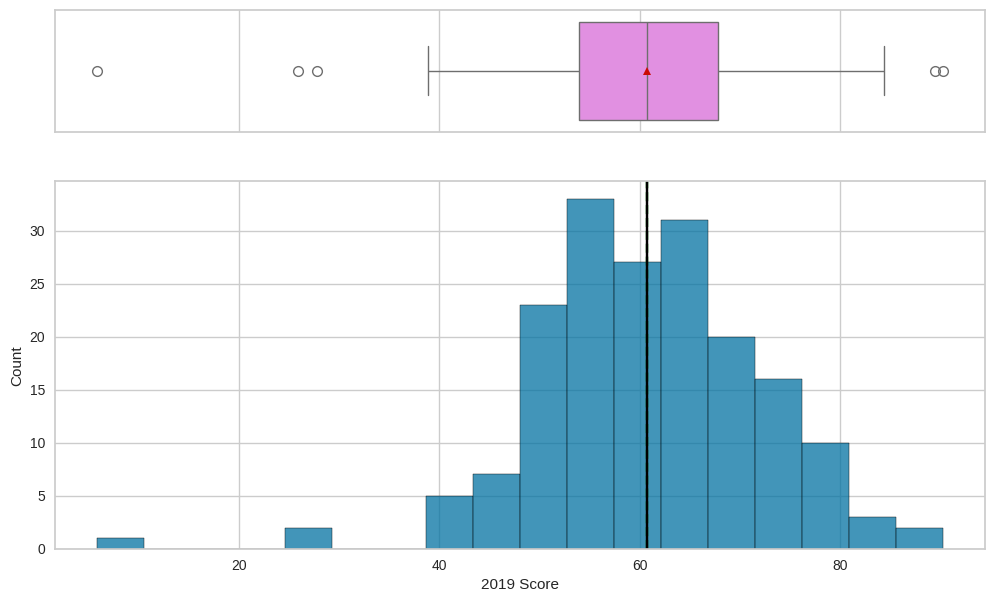

In [ ]:
histogram_boxplot(df, "2019 Score")

- 2019 sore looks slightly normally distributed with a few lower outliers, and the mean and median scores are close to 60.

`Income Tax Rate (%)`

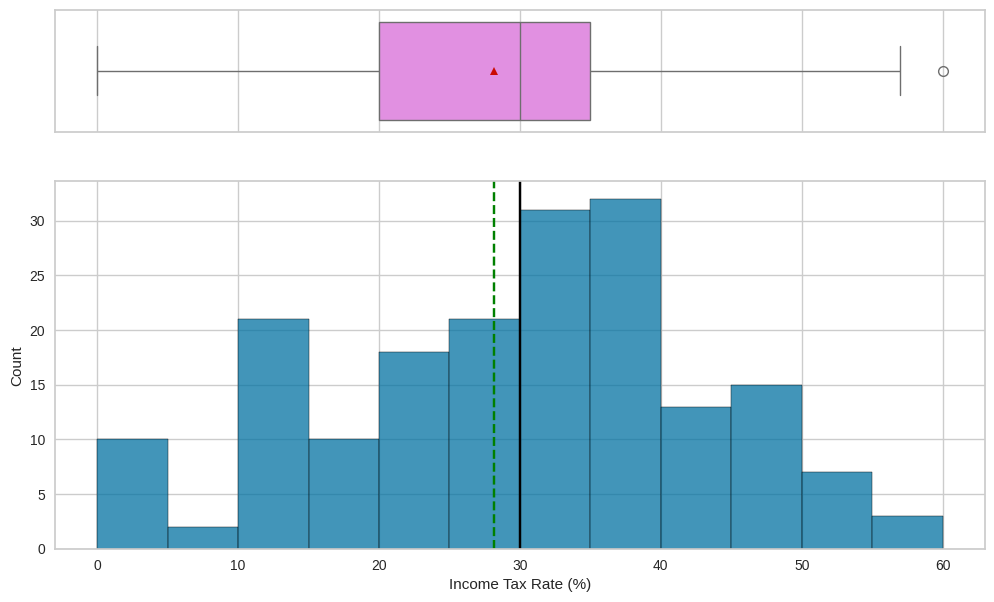

In [ ]:
histogram_boxplot(df, "Income Tax Rate (%)")

- Income tax rate varies between 0% to 60%, with a median of 30%.

`Population (Millions)`

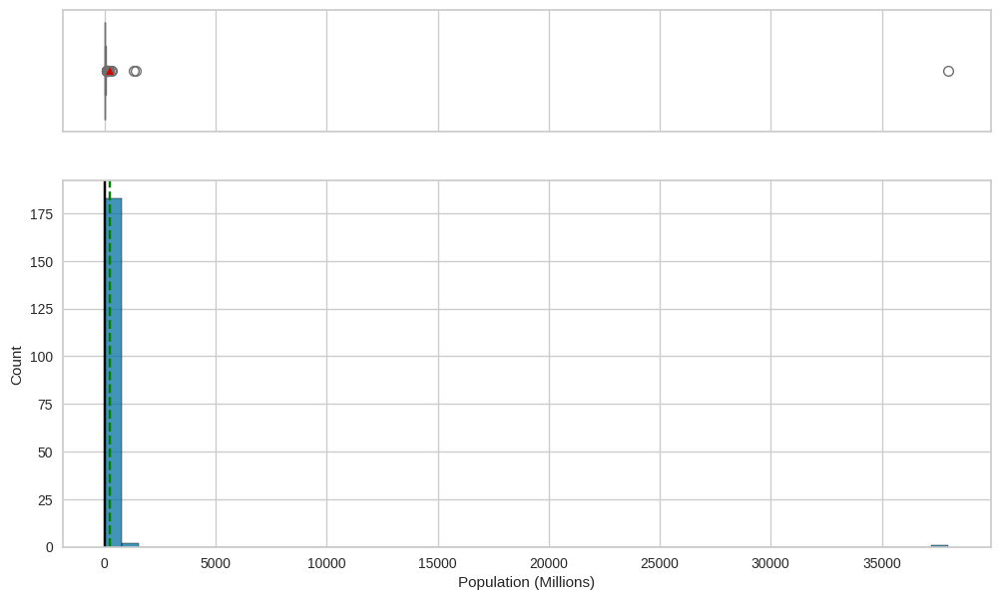

In [ ]:
histogram_boxplot(df, "Population (Millions)", bins=50)

- Population is heavily right-skewed.

`Region`

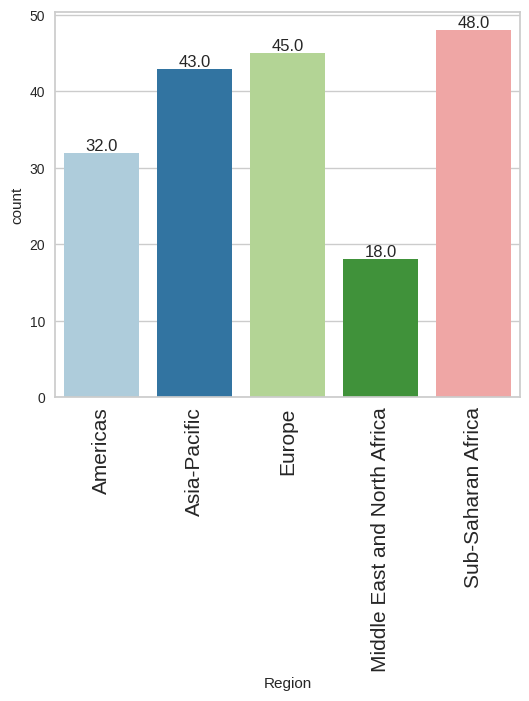

In [ ]:
labeled_barplot(df, "Region")

- The region of Sub-Saharan Africa has the highest number of countries in the data, while Middle East and North America has the lowest.

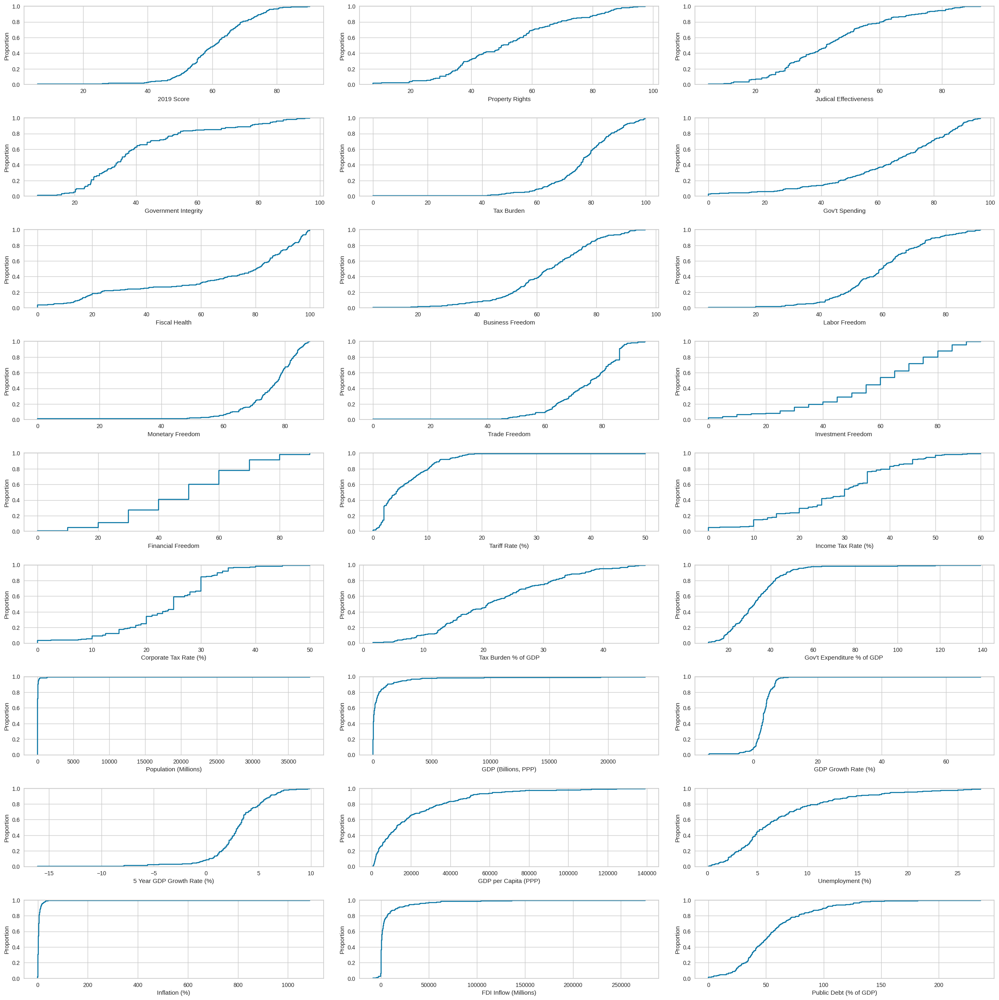

In [ ]:
cols_list = df.select_dtypes(include=np.number).columns.to_list()
cols_list.remove("World Rank")
cols_list.remove("Region Rank")

fig, axes = plt.subplots(9, 3, figsize=(25, 25))
counter = 0

for ii in range(9):
    sns.ecdfplot(ax=axes[ii][0], x=df[cols_list[counter]])
    counter = counter + 1

    sns.ecdfplot(ax=axes[ii][1], x=df[cols_list[counter]])
    counter = counter + 1

    sns.ecdfplot(ax=axes[ii][2], x=df[cols_list[counter]])
    counter = counter + 1

fig.tight_layout(pad=2.0)

**Observations**

- 50% of countries have a 2019 score of less than 60.
- 80% of countries have properties right score less than 70.
- 80% of countries have a Judicial Effectiveness score of less than 60.
- 80% of countries have Govt integrity less than 50.
- 20% of countries have a tax burden of less than 70.
- 40% of countries have govt spending less than 63.
- 40% of countries have fiscal health less than 70.
- 40% of countries have Business freedom less than 60.
- 60% of countries have labor freedom less than 63.
- 20% of countries have monetary freedom less than 70.
- 60% of countries have trade freedom less than 80.
- 80% of countries have a Tariff Rate of less than 10%.
- 80% of countries have an income tax rate of less than 40%.
- 80% of countries have a corporate tax rate of less than 30%.
- 80% of countries have a Tax burden of less than 33% of their GDP.

## Bivariate Analysis

**Let's check for correlations.**

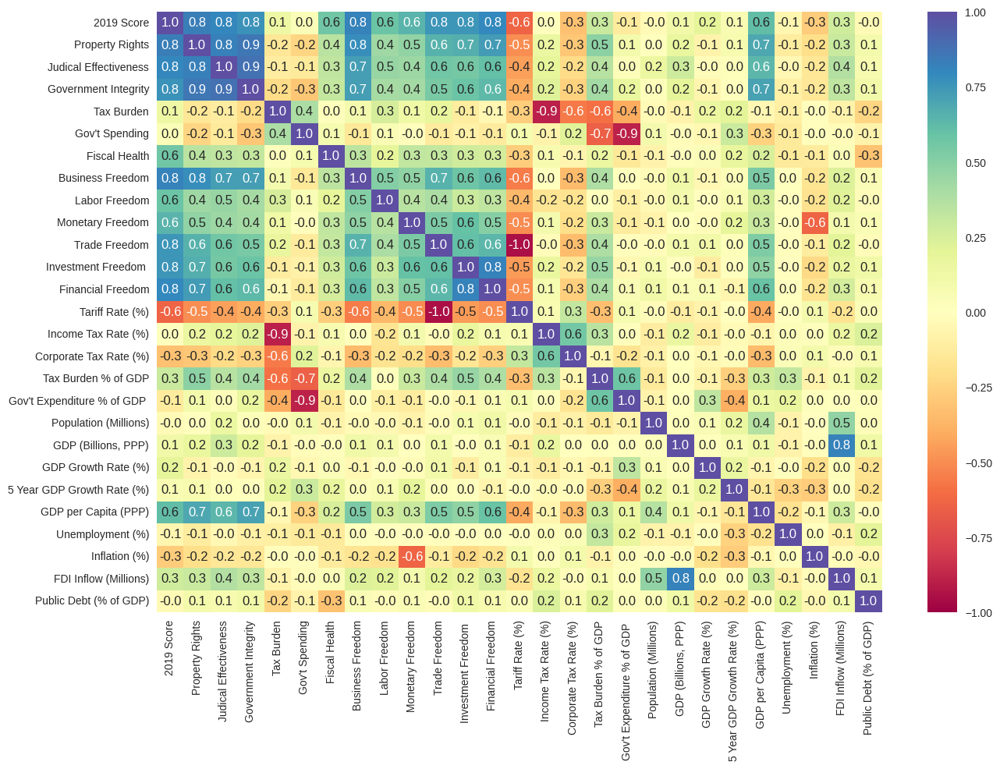

In [ ]:
plt.figure(figsize=(15, 10))
sns.heatmap(
    df[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".1f", cmap="Spectral"
)
plt.show()

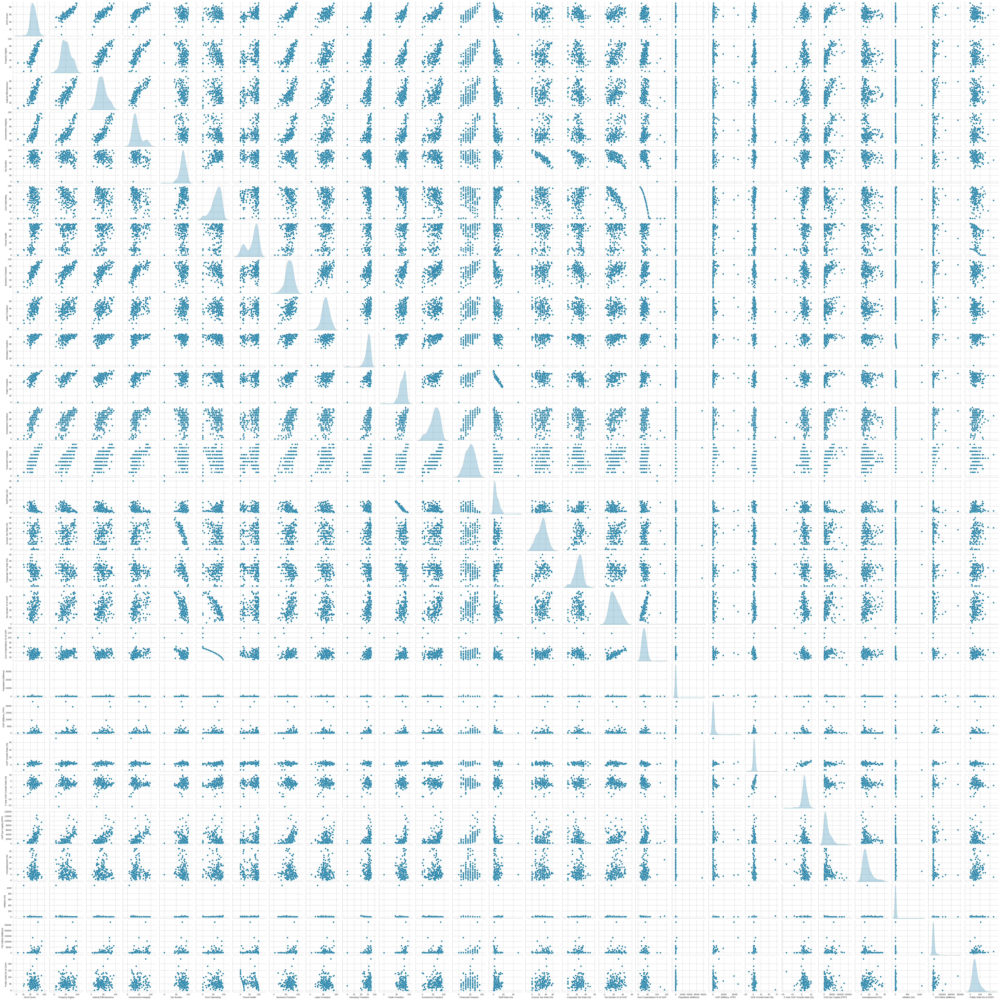

In [ ]:
sns.pairplot(data=df[cols_list], diag_kind="kde")
plt.show()

**Observations**

- *Tariff Rate (%)* and *Trade Freedom* are perfectly negatively correlated.
- *2019 Score* is highly positively correlated with many variables.

We will drop the *Tariff Rate (%)* column from the data.

In [ ]:
df.drop("Tariff Rate (%)", axis=1, inplace=True)

# **Data Preprocessing (Continued)**

## Missing Value Treatment

In [ ]:
df.isna().sum()

,0
Country Name,0
WEBNAME,0
Region,0
World Rank,6
Region Rank,6
2019 Score,6
Property Rights,1
Judical Effectiveness,1
Government Integrity,1
Tax Burden,6


In [ ]:
# let's impute missing values with column median
df = df.fillna(df.median(numeric_only = True))

In [ ]:
# let's see if missing values has been imputed
df.isna().sum()

,0
Country Name,0
WEBNAME,0
Region,0
World Rank,0
Region Rank,0
2019 Score,0
Property Rights,0
Judical Effectiveness,0
Government Integrity,0
Tax Burden,0


* Missing values are imputed.

## Scaling

- Let's scale the data before we proceed with clustering.

In [ ]:
scaler = StandardScaler()
to_exclude = [
    "CountryID",
    "Country Name",
    "WEBNAME",
    "Region",
    "World Rank",
    "Region Rank",
    "Country",
]

# columns to be used for clustering are
col_4_clustering = [c for c in df.columns if c not in to_exclude]
print(col_4_clustering)

['2019 Score', 'Property Rights', 'Judical Effectiveness', 'Government Integrity', 'Tax Burden', "Gov't Spending", 'Fiscal Health', 'Business Freedom', 'Labor Freedom', 'Monetary Freedom', 'Trade Freedom', 'Investment Freedom ', 'Financial Freedom', 'Income Tax Rate (%)', 'Corporate Tax Rate (%)', 'Tax Burden % of GDP', "Gov't Expenditure % of GDP ", 'Population (Millions)', 'GDP (Billions, PPP)', 'GDP Growth Rate (%)', '5 Year GDP Growth Rate (%)', 'GDP per Capita (PPP)', 'Unemployment (%)', 'Inflation (%)', 'FDI Inflow (Millions)', 'Public Debt (% of GDP)']


In [ ]:
df_scaled = df[col_4_clustering].copy()
df_scaled.iloc[:, :] = scaler.fit_transform(df_scaled.iloc[:, :])
df_scaled.head()

,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,-0.839325,-1.677422,-0.849008,-0.824636,1.115910,0.699408,1.050845,-0.911165,0.066904,0.143379,-0.686064,-2.111766,-2.025088,-0.620657,-0.446068,-1.721318,-0.539091,-0.075098,-0.256202,-0.167089,-0.029158,-0.810279,0.258867,-0.068211,-0.299706,-1.454188
1,0.519137,0.127383,-0.793476,-0.052722,0.699186,0.420030,0.456673,0.367928,-0.473842,0.574384,1.115771,0.567860,1.105103,-0.393929,-1.016613,0.281538,-0.283665,-0.086826,-0.270220,0.074768,-0.167334,-0.366164,1.170042,-0.105982,-0.258076,0.441111
2,-1.319316,-1.062147,-0.482499,-0.636736,-0.064807,-0.680022,-1.510131,-0.122073,-0.670477,-0.018248,-0.570350,-1.218558,-0.981691,0.512982,-0.103741,0.241280,0.495710,-0.072939,-0.021196,-0.253467,0.039930,-0.251231,0.473261,-0.060657,-0.254797,-0.905471
3,-0.920833,-0.841674,-1.015603,-1.063319,0.513976,0.716869,-0.255062,-0.497528,-0.045459,-1.769206,-1.082799,-1.218558,-0.459992,-0.847385,0.695022,-0.151240,-0.558739,-0.077724,-0.205847,-0.478048,-0.029158,-0.608408,0.151670,0.267950,-0.389922,0.266114
4,-0.775931,-0.231527,-0.021586,-0.403130,-0.612721,-0.645100,-1.055765,-0.452982,-0.881157,-1.338201,-0.355452,-0.102047,0.583405,0.512982,0.695022,0.875350,0.469513,-0.072004,0.098664,-0.097987,-0.789125,-0.013828,0.241001,0.192408,0.161580,-0.110573


In [ ]:
# creating dataframe copies for k-means and hierarchical clustering
km_df = df.copy()
hc_df = df.copy()

# **Model Building**

## K-means Clustering

### Checking Elbow Plot

Number of Clusters: 2 	Average Distortion: 4.026700363724503
Number of Clusters: 3 	Average Distortion: 3.7909659914678837
Number of Clusters: 4 	Average Distortion: 3.695800223816484
Number of Clusters: 5 	Average Distortion: 3.57343931099595
Number of Clusters: 6 	Average Distortion: 3.494478316156978
Number of Clusters: 7 	Average Distortion: 3.4540267728331187
Number of Clusters: 8 	Average Distortion: 3.361957198861637
Number of Clusters: 9 	Average Distortion: 3.2131119555266348
Number of Clusters: 10 	Average Distortion: 3.178397554637206


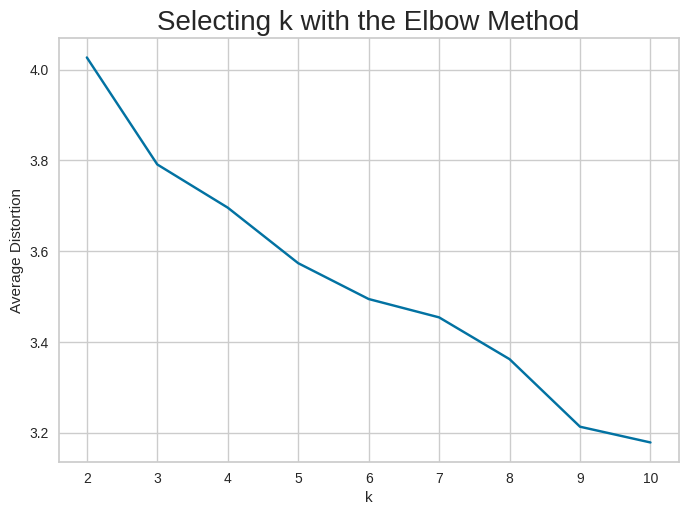

In [ ]:
clusters = range(2, 11)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(df_scaled)
    prediction = model.predict(df_scaled)
    distortion = (
        sum(np.min(cdist(df_scaled, model.cluster_centers_, "euclidean"), axis=1))
        / df_scaled.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("k")
plt.ylabel("Average Distortion")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

**Let's do further analysis to determine the optimal value of k**

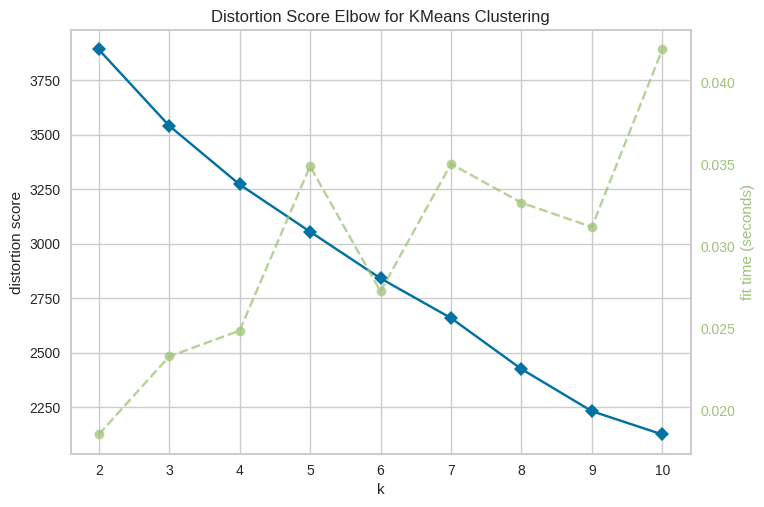

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 11), timings=True)
visualizer.fit(df_scaled)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

### Checking Silhouette Scores

**Let's check the silhouette scores.**

For n_clusters = 2, the silhouette score is 0.19552937824795616)
For n_clusters = 3, the silhouette score is 0.1404599941174296)
For n_clusters = 4, the silhouette score is 0.14887314576988261)
For n_clusters = 5, the silhouette score is 0.13888490928100433)
For n_clusters = 6, the silhouette score is 0.1389281495048456)
For n_clusters = 7, the silhouette score is 0.11583847160176766)
For n_clusters = 8, the silhouette score is 0.1353455977604893)
For n_clusters = 9, the silhouette score is 0.1373701474351106)
For n_clusters = 10, the silhouette score is 0.11459787169771589)


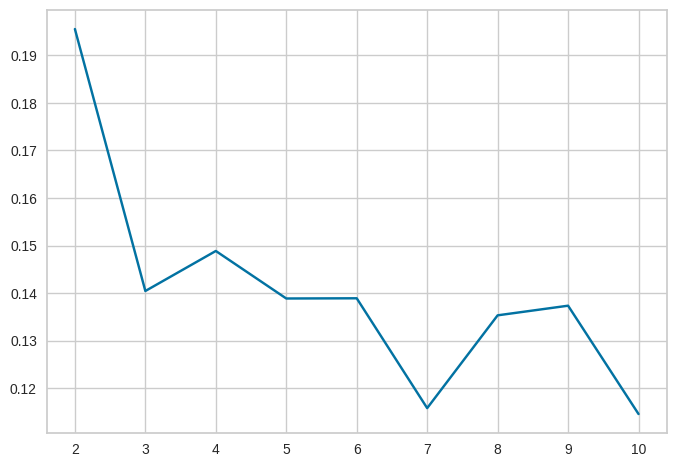

In [ ]:
sil_score = []
cluster_list = range(2, 11)
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict((df_scaled))
    score = silhouette_score(df_scaled, preds)
    sil_score.append(score)
    print("For n_clusters = {}, the silhouette score is {})".format(n_clusters, score))

plt.plot(cluster_list, sil_score)
plt.show()

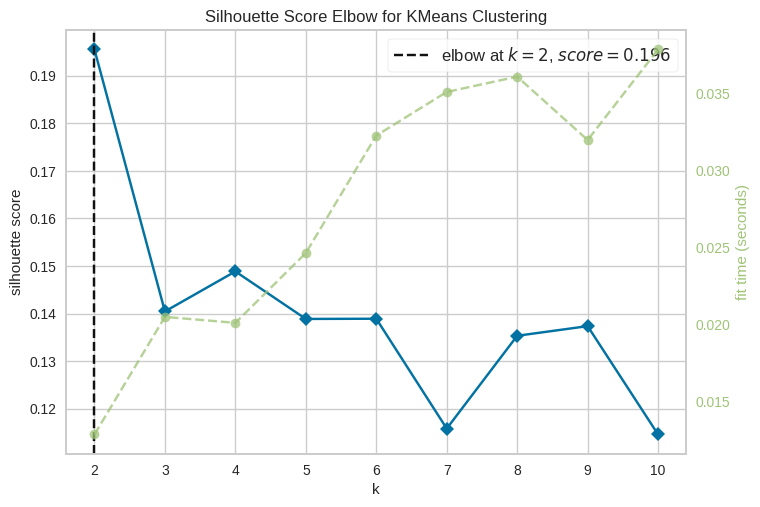

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 11), metric="silhouette", timings=True)
visualizer.fit(df_scaled)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

**From the silhouette scores, it seems that 4 is a good value for k.**

**Silhouette Plot**

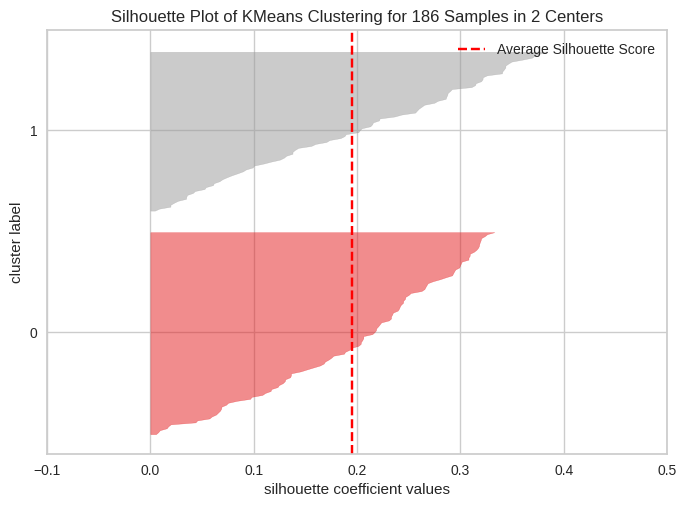

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 186 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(2, random_state=1))
visualizer.fit(df_scaled)
visualizer.show()

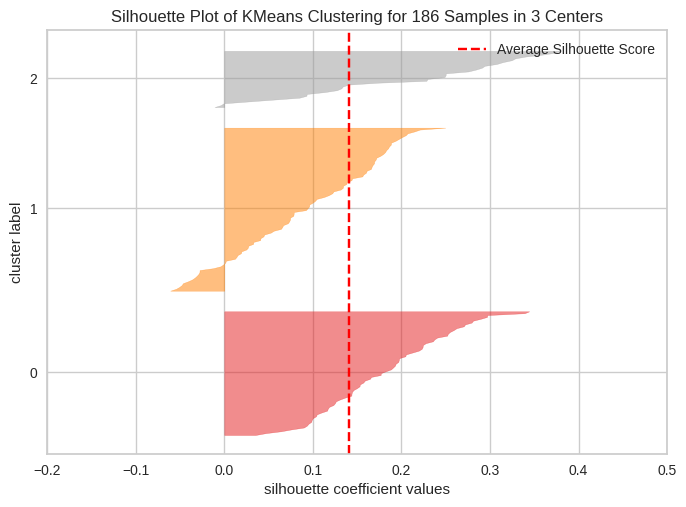

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 186 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(df_scaled)
visualizer.show()

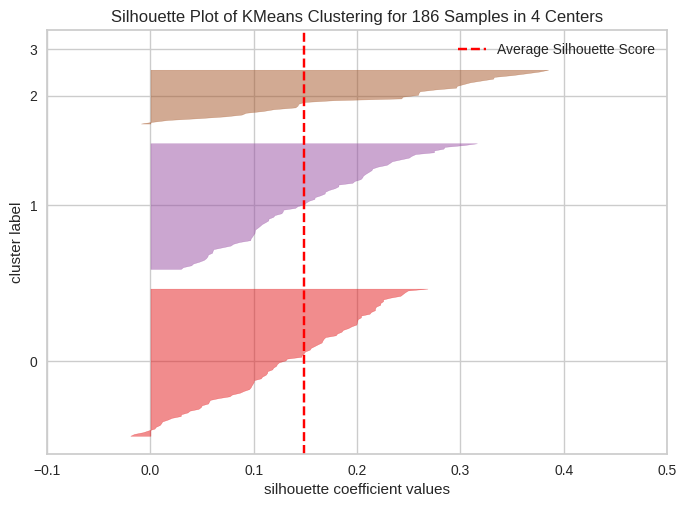

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 186 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(df_scaled)
visualizer.show()

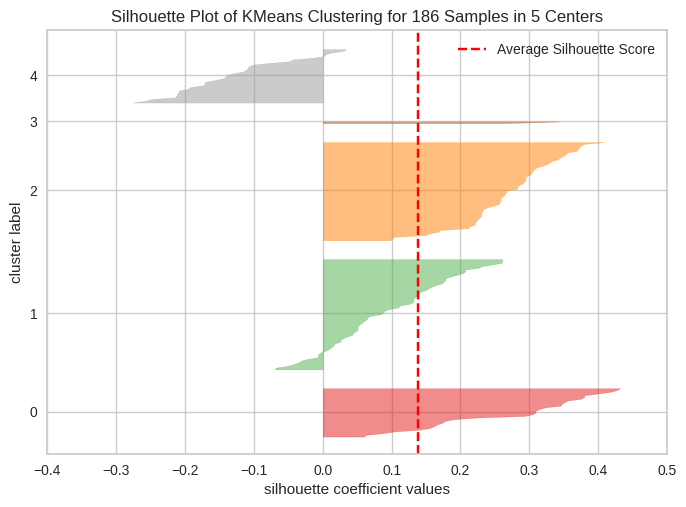

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 186 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(df_scaled)
visualizer.show()

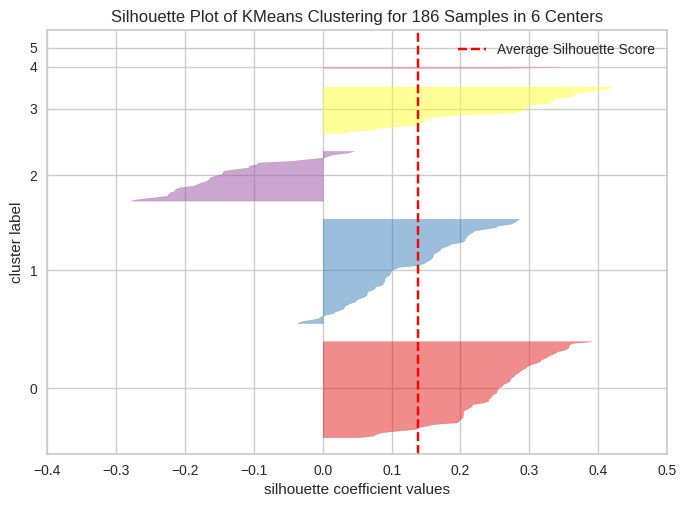

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 186 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(6, random_state=1))
visualizer.fit(df_scaled)
visualizer.show()

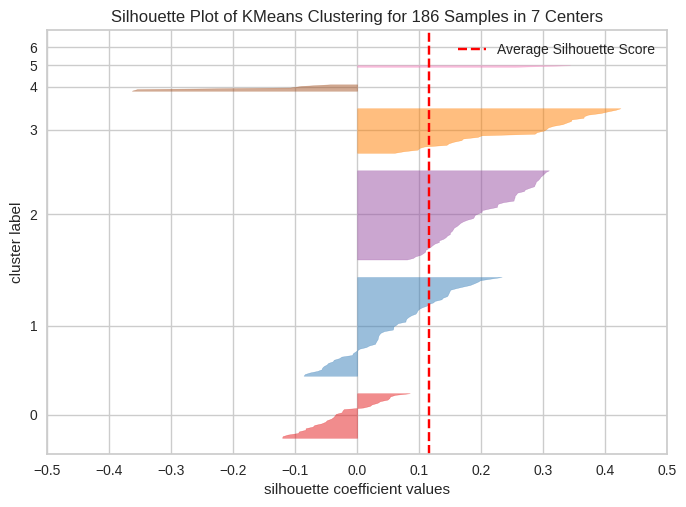

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 186 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# Finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(7, random_state=1))
visualizer.fit(df_scaled)
visualizer.show()

**We will proceed with k=4**

### Creating Final Model

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=1)
kmeans.fit(df_scaled)

KMeans(n_clusters=4, random_state=1)

In [ ]:
# adding kmeans cluster labels to the original dataframe
km_df["KM_segments"] = kmeans.labels_

## Hierarchical Clustering

### Computing Cophenetic Correlation

In [ ]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(df_scaled, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(df_scaled))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.8412398287399091.
Cophenetic correlation for Euclidean distance and complete linkage is 0.66758004237238.
Cophenetic correlation for Euclidean distance and average linkage is 0.9030217227584922.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.7828501672039855.
Cophenetic correlation for Chebyshev distance and single linkage is 0.7989277723423043.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.7826534753469147.
Cophenetic correlation for Chebyshev distance and average linkage is 0.8479230357125662.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.8524137659955267.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.7973545416116283.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.7444897446881157.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.8008780045709823.
Cophenetic corr

In [ ]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9030217227584922, which is obtained with Euclidean distance and average linkage.


### Checking Dendrograms

**We see that the cophenetic correlation is maximum with Euclidean distance and average linkage.**


**Let's view the dendrograms for the different linkage methods.**

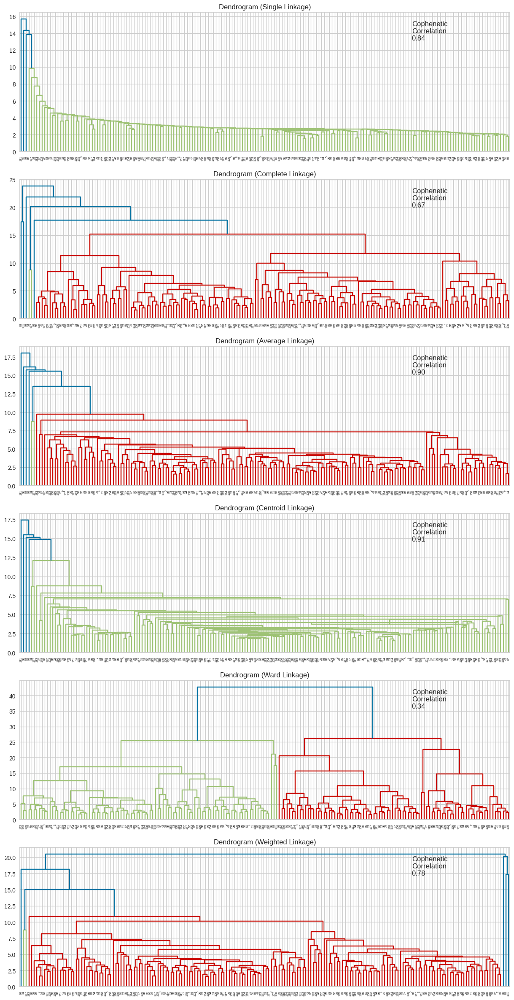

In [ ]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
compare = []

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(df_scaled, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(df_scaled))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

    compare.append([method, coph_corr])

**Observations**

- Looking the the above dendrograms, the Ward linkage seems to result in the best separation between clusters, even though its cophenetic correlation is lower than the other linkages.
- 4 looks to be a good choice for no. of clusters.

### Creating Final Model

In [ ]:
hc = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="ward")
hc_labels = hc.fit_predict(df_scaled)

In [ ]:
hc_df["HC_segments"] = hc_labels

# **Cluster Profiling and Comparison**

## Cluster Profiling: K-means Clustering

In [ ]:
pd.crosstab(km_df.KM_segments, km_df.Region)

Region,Americas,Asia-Pacific,Europe,Middle East and North Africa,Sub-Saharan Africa
KM_segments,,,,,
0,14,20,1,9,39
1,15,16,23,8,9
2,2,7,21,1,0
3,1,0,0,0,0


**Observations**

- Majority of the European countries are in Cluster 1 and Cluster 2.
- Majority of Asia-Pacific, American, Middle East and North Africa countries are in Cluster 0 and Cluster 1.
- Almost all Sub-Saharan African countries are in Cluster 0.
- There is only 1 country (American) in cluster 3.

In [ ]:
clusters = km_df.KM_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        km_df[km_df["KM_segments"] == cl]["Country Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(km_df[km_df["KM_segments"] == cl]["Country Name"].unique())
    print("-" * 100, "\n")

The 83 countries in cluster 0 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia'
 'Cameroon' 'Central African Republic' 'Chad' 'China' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Cuba' 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'India' 'Iran' 'Iraq' 'Kenya' 'Kiribati' 'Korea, North ' 'Laos' 'Lebanon'
 'Liberia' 'Libya' 'Madagascar' 'Malawi' 'Mali' 'Mauritania' 'Mozambique'
 'Nepal' 'Nicaragua' 'Niger' 'Nigeria' 'Pakistan' 'Papua New Guinea'
 'Philippines' 'São Tomé and Príncipe' 'Senegal' 'Sierra Leone'
 'Solomon Islands' 'Somalia' 'Sri Lanka' 'Sudan' 'Suriname' 'Syria'
 'Tajikistan' 'Tanzania' 'Timor-Leste' 'Togo' 'Tunisia' 'Turkmenistan'
 'Uganda' 'Ukraine' 'Uzbekistan' 'Vietnam' 'Yemen' 'Zam

In [ ]:
km_df_profiling = km_df.groupby("KM_segments")[col_4_clustering].mean()
km_df_profiling["count_in_each_segment"] = (
    km_df.groupby("KM_segments")["2019 Score"].count().values
)

# displaying the group-wise means of variables
km_df_profiling.style.highlight_max(color="lightgreen", axis=0)

,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
KM_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,52.710241,36.918072,33.061446,28.000000,76.682530,71.926506,54.316867,51.671084,52.800000,70.632530,66.295181,43.192771,36.506024,30.104819,28.046988,17.361446,30.927108,62.272289,605.839759,4.279518,3.493976,6838.289157,6.632530,7.036747,4145.642169,54.922892,83
1,64.773944,57.770423,47.932394,43.049296,83.548592,63.390141,72.936620,69.636620,65.088732,78.183099,78.687324,64.154930,53.802817,20.146479,19.380282,22.809859,33.965493,551.971831,351.369014,2.964789,2.757746,25343.126761,8.635211,3.086620,3170.869014,51.028169,71
2,74.290323,82.490323,70.609677,74.809677,64.364516,46.032258,84.319355,82.180645,65.338710,82.441935,86.148387,81.129032,71.612903,41.432258,22.877419,33.409677,41.183871,33.519355,1663.122581,3.006452,2.487097,50483.032258,6.322581,1.516129,27975.796774,72.919355,31
3,25.900000,7.600000,13.100000,7.900000,74.700000,58.100000,17.600000,33.900000,28.000000,0.000000,60.000000,0.000000,10.000000,34.000000,34.000000,14.900000,37.400000,31.400000,380.700000,-14.000000,-7.800000,12114.000000,7.700000,1087.500000,-68.000000,34.900000,1


In [ ]:
# let's plot the attributes of only the big clusters
c1 = [0, 1, 2]
km_df2 = km_df[km_df.KM_segments.isin(c1)]

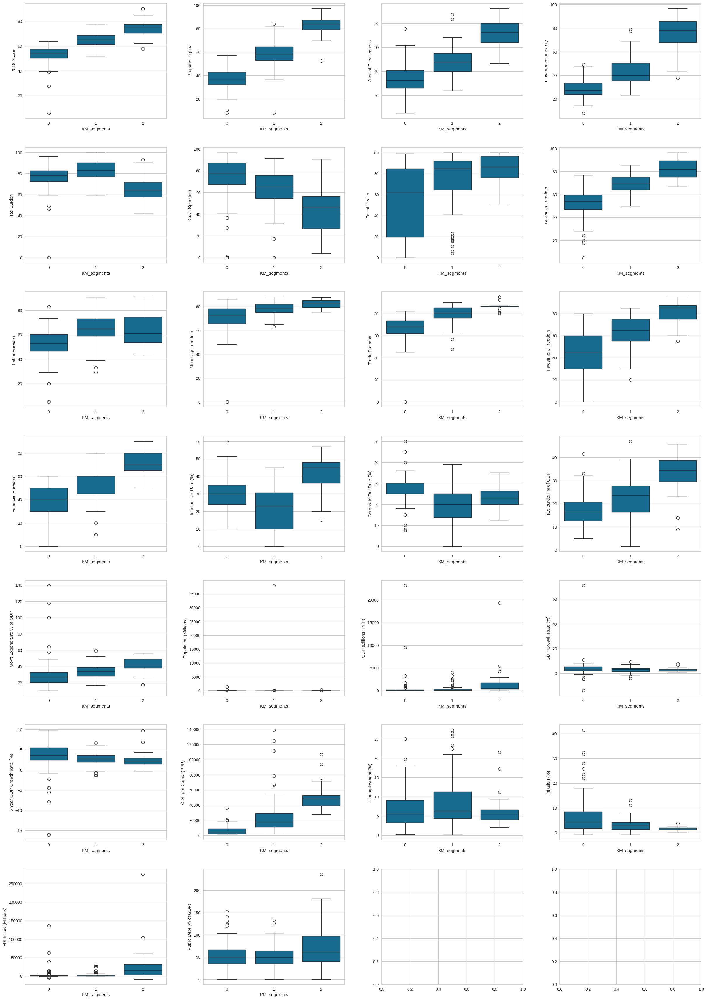

In [ ]:
fig, axes = plt.subplots(7, 4, figsize=(25, 35))
counter = 0

for ii in range(7):
    for jj in range(4):
        if counter < 26:
            sns.boxplot(
                ax=axes[ii][jj],
                y=km_df2[col_4_clustering[counter]],
                x=km_df2["KM_segments"],
            )
            counter = counter + 1

fig.tight_layout(pad=3.0)

### Insights

#### Cluster 0

  - Countries in this cluster have a lower 2019 Score compared to the other clusters, with a mean value of 52.71.

  - Property Rights, Judicial Effectiveness, and Government Integrity scores are also lower in this cluster compared to the other clusters.

  - Tax Burden is slightly lower in this cluster compared to Cluster 1 and Cluster 2.

  - Government Spending is lower in Cluster 0 compared to the other clusters.

  - Fiscal Health is also lower in Cluster 0 compared to the other clusters.

  - Business Freedom and Labor Freedom scores are moderate in this cluster.

  - Monetary Freedom, Trade Freedom, and Investment Freedom scores are also moderate in Cluster 0.

  - Financial Freedom score is slightly lower in Cluster 0 compared to Cluster 1 and Cluster 2.

  - Income Tax Rate (%) and Corporate Tax Rate (%) are moderate in this cluster.

  - Tax Burden (% of GDP) is slightly lower in Cluster 0 compared to the other clusters.

  - Government Expenditure (% of GDP) is lower in Cluster 0 compared to the other clusters.

  - The Population in this cluster is moderate, with a mean value of 62.27 million.

  - The GDP (Billions, PPP) is also moderate in Cluster 0.

  - GDP Growth Rate (%) is moderate in Cluster 0.

  - 5 Year GDP Growth Rate (%) is also moderate in Cluster 0.

  - GDP per Capita (PPP) is moderate in Cluster 0.

  - The Unemployment Rate (%) is higher in Cluster 0 compared to the other clusters.

  - The Inflation Rate (%) is moderate in Cluster 0.

  - FDI Inflow (Millions) is lower in Cluster 0 compared to the other clusters.

  - Public Debt (% of GDP) is moderate in Cluster 0.

#### Cluster 1

- Countries in this cluster have a higher 2019 Score compared to the other clusters, with a mean value of 70.63.

- Property Rights, Judicial Effectiveness, and Government Integrity scores are also higher in this cluster compared to the other clusters.

- Tax Burden is slightly higher in this cluster compared to Cluster 0 and Cluster 2.

- Government Spending is higher in Cluster 1 compared to the other clusters.

- Fiscal Health is also higher in Cluster 1 compared to the other clusters.

- Business Freedom and Labor Freedom scores are moderate in this cluster.

- Monetary Freedom, Trade Freedom, and Investment Freedom scores are also moderate in Cluster 1.

- Financial Freedom score is slightly higher in Cluster 1 compared to Cluster 0 and Cluster 2.

- Income Tax Rate (%) and Corporate Tax Rate (%) are moderate in this cluster.

- Tax Burden (% of GDP) is slightly higher in Cluster 1 compared to the other clusters.

- Government Expenditure (% of GDP) is higher in Cluster 1 compared to the other clusters.

- The Population in this cluster is high, with a mean value of 519.39 million.

- The GDP (Billions, PPP) is also high in Cluster 1.

- GDP Growth Rate (%) is moderate in Cluster 1.

- 5 Year GDP Growth Rate (%) is also moderate in Cluster 1.

- GDP per Capita (PPP) is moderate in Cluster 1.

-  The Unemployment Rate (%) is moderate in Cluster 1.

- The Inflation Rate (%) is moderate in Cluster 1.

- FDI Inflow (Millions) is high in Cluster 1 compared to the other clusters.

- Public Debt (% of GDP) is moderate in Cluster 1.

#### Cluster 2

- Countries in this cluster have a moderate 2019 Score compared to the other clusters, with a mean value of 54.93.

- Property Rights, Judicial Effectiveness, and Government Integrity scores are also moderate in this cluster.

- Tax Burden is moderate in this cluster.

- Government Spending is moderate in Cluster 2 compared to the other clusters.

- Fiscal Health is also moderate in Cluster 2 compared to the other clusters.

- Business Freedom and Labor Freedom scores are moderate in this cluster.

- Monetary Freedom, Trade Freedom, and Investment Freedom scores are also moderate in Cluster 2.

- Financial Freedom score is moderate in Cluster 2.

- Income Tax Rate (%) and Corporate Tax Rate (%) are moderate in this cluster.

- Tax Burden (% of GDP) is moderate in Cluster 2.

- Government Expenditure (% of GDP) is moderate in Cluster 2.

- The Population in this cluster is moderate, with a mean value of 253.43 million.

- The GDP (Billions, PPP) is also moderate in Cluster 2.

- GDP Growth Rate (%) is moderate in Cluster 2.

- 5 Year GDP Growth Rate (%) is also moderate in Cluster 2.

- GDP per Capita (PPP) is moderate in Cluster 2.

- The Unemployment Rate (%) is moderate in Cluster 2.

- The Inflation Rate (%) is moderate in Cluster 2.

- FDI Inflow (Millions) is moderate in Cluster 2.

- Public Debt (% of GDP) is moderate in Cluster 2.

## Cluster Profiling: Hierarchical Clustering

In [ ]:
pd.crosstab(hc_df.HC_segments, hc_df.Region)

Region,Americas,Asia-Pacific,Europe,Middle East and North Africa,Sub-Saharan Africa
HC_segments,,,,,
0,3,8,22,1,0
1,1,1,0,1,0
2,12,11,19,8,4
3,16,23,4,8,44


**Observations**

- Majority of the European countries are in Cluster 0 and Cluster 2.
- Majority of Asia-Pacific, American, Middle East and North Africa countries are in Cluster 2 and Cluster 3.
- Almost all Sub-Saharan African countries are in Cluster 3.
- There are 3 countries in Cluster 1.

In [ ]:
clusters = hc_df.HC_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        hc_df[hc_df["HC_segments"] == cl]["Country Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(hc_df[hc_df["HC_segments"] == cl]["Country Name"].unique())
    print("-" * 100, "\n")

The 95 countries in cluster 3 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belarus'
 'Belize' 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi'
 'Cambodia' 'Cameroon' 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Cuba' 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Eswatini' 'Ethiopia' 'Fiji'
 'Gabon' 'Gambia' 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana'
 'Haiti' 'Honduras' 'India' 'Iran' 'Iraq' 'Kenya' 'Kiribati' 'Laos'
 'Lebanon' 'Lesotho' 'Liberia' 'Madagascar' 'Malawi' 'Mali' 'Mauritania'
 'Micronesia' 'Moldova' 'Mongolia' 'Mozambique' 'Namibia' 'Nepal'
 'Nicaragua' 'Niger' 'Nigeria' 'Pakistan' 'Panama' 'Papua New Guinea'
 'Paraguay' 'Philippines' 'Russia' 'Samoa' 'São Tomé and Príncipe'
 'Senegal' 'Seychelles' 'Sierra Leone' 'Solomon Islands' 'Somalia'
 'South Africa' 'Sri Lanka' 'Sudan' 'Suriname' 'Syria' 'Tajikist

In [ ]:
hc_df_profiling = hc_df.groupby("HC_segments")[col_4_clustering].mean()
hc_df_profiling["count_in_each_segment"] = (
    hc_df.groupby("HC_segments")["2019 Score"].count().values
)

# displaying the group-wise means of variables
hc_df_profiling.style.highlight_max(color="lightgreen", axis=0)

,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,73.461765,80.738235,69.441176,72.426471,65.297059,47.370588,83.826471,80.908824,64.614706,82.247059,85.835294,79.117647,69.705882,41.305882,22.197059,32.691176,40.617647,72.120588,2214.135294,2.991176,2.391176,47813.911765,6.644118,1.508824,29869.458824,72.264706,34
1,30.850000,15.600000,14.166667,16.033333,50.916667,19.366667,12.533333,26.366667,28.100000,17.600000,45.366667,1.666667,20.000000,24.666667,26.333333,18.766667,92.200000,21.066667,161.700000,19.300000,-4.233333,7933.333333,10.066667,372.750000,297.333333,29.833333,3
2,66.336111,59.422222,50.903704,45.235185,84.539815,65.683333,72.966667,70.314815,66.168519,78.816667,78.859259,67.314815,57.037037,18.803704,18.601852,21.966667,32.908333,720.975926,354.444444,3.098148,2.835185,28946.703704,7.968519,2.808333,3260.129630,52.200000,54
3,54.004211,39.263158,33.652632,28.991579,78.195789,70.948421,57.793684,54.604211,54.767368,72.251579,68.494737,45.526316,37.578947,28.986316,27.462105,18.495789,30.083684,41.906316,339.617895,3.347368,3.509474,7699.294737,7.167368,6.489474,2567.380000,53.807368,95


In [ ]:
# let's plot the attributes of only the big clusters
c1 = [0, 2, 3]
hc_df2 = hc_df[hc_df.HC_segments.isin(c1)]

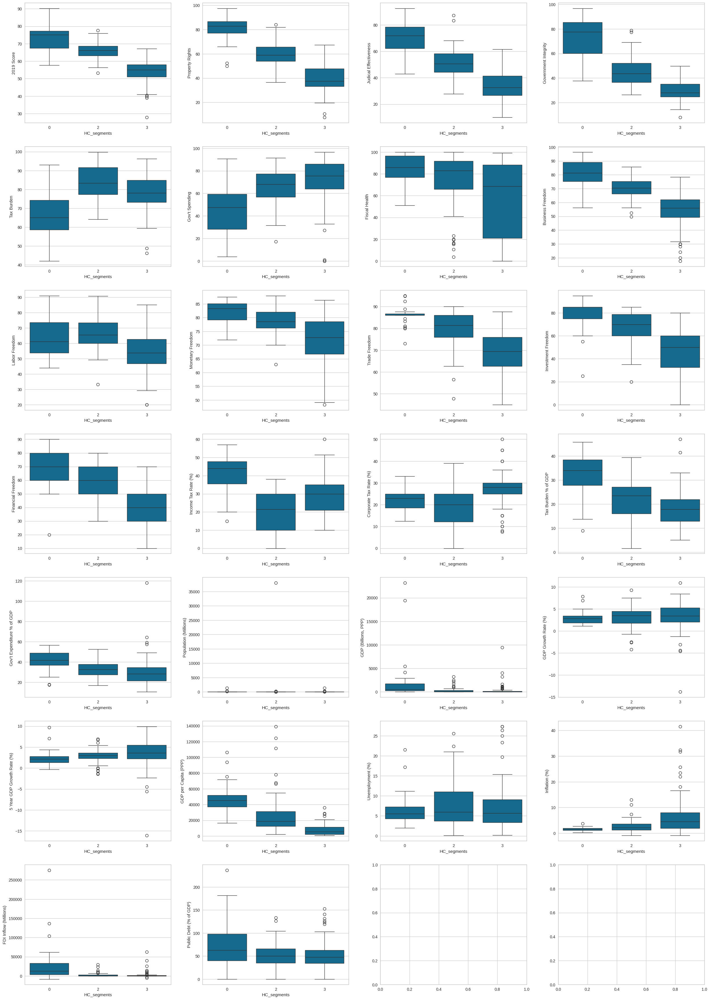

In [ ]:
fig, axes = plt.subplots(7, 4, figsize=(25, 35))
counter = 0

for ii in range(7):
    for jj in range(4):
        if counter < 26:
            sns.boxplot(
                ax=axes[ii][jj],
                y=hc_df2[col_4_clustering[counter]],
                x=hc_df2["HC_segments"],
            )
            counter = counter + 1

fig.tight_layout(pad=2.0)

### Insights

#### Cluster 0

  - There are 34 countries in this cluster.
  - Countries in this cluster have a high 2019 score with a mean value of ~73.4.
  - Countries in this cluster have high business and trade freedom scores.
  - The mean population across countries in this cluster is moderate.
  - Countries in this cluster have a high GDP but low GDP growth rate.
  - The unemployment rate of the countries in this cluster has moderate variance with a comparatively moderate mean.

#### Cluster 2

  - There are 54 countries in this cluster.
  - Countries in this cluster have a moderate 2019 score with a mean value of ~66.
  - Countries in this cluster have moderate business and trade freedom scores.
  - The mean population across countries in this cluster is very high.
  - Countries in this cluster have a moderate GDP and comparatively moderate GDP growth rate.
  - The unemployment rate of the countries in this cluster has a high variance with a comparatively higher mean.

#### Cluster 3

  - There are 95 countries in this cluster.
  - Countries in this cluster have a moderate 2019 score with a mean value of ~54.
  - Countries in this cluster have moderate business and trade freedom scores.
  - The mean population across countries in this cluster is moderate.
  - Countries in this cluster have a moderate GDP and GDP growth rate.
  - The unemployment rate of the countries in this cluster has little variance with a comparatively moderate mean.

## K-means vs Hierarchical Clustering

In [ ]:
km_df_profiling.style.highlight_max(color="lightgreen", axis=0)

,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
KM_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,52.710241,36.918072,33.061446,28.000000,76.682530,71.926506,54.316867,51.671084,52.800000,70.632530,66.295181,43.192771,36.506024,30.104819,28.046988,17.361446,30.927108,62.272289,605.839759,4.279518,3.493976,6838.289157,6.632530,7.036747,4145.642169,54.922892,83
1,64.773944,57.770423,47.932394,43.049296,83.548592,63.390141,72.936620,69.636620,65.088732,78.183099,78.687324,64.154930,53.802817,20.146479,19.380282,22.809859,33.965493,551.971831,351.369014,2.964789,2.757746,25343.126761,8.635211,3.086620,3170.869014,51.028169,71
2,74.290323,82.490323,70.609677,74.809677,64.364516,46.032258,84.319355,82.180645,65.338710,82.441935,86.148387,81.129032,71.612903,41.432258,22.877419,33.409677,41.183871,33.519355,1663.122581,3.006452,2.487097,50483.032258,6.322581,1.516129,27975.796774,72.919355,31
3,25.900000,7.600000,13.100000,7.900000,74.700000,58.100000,17.600000,33.900000,28.000000,0.000000,60.000000,0.000000,10.000000,34.000000,34.000000,14.900000,37.400000,31.400000,380.700000,-14.000000,-7.800000,12114.000000,7.700000,1087.500000,-68.000000,34.900000,1


In [ ]:
clusters = km_df.KM_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        km_df[km_df["KM_segments"] == cl]["Country Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(km_df[km_df["KM_segments"] == cl]["Country Name"].unique())
    print("-" * 100, "\n")

The 83 countries in cluster 0 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia'
 'Cameroon' 'Central African Republic' 'Chad' 'China' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Cuba' 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'India' 'Iran' 'Iraq' 'Kenya' 'Kiribati' 'Korea, North ' 'Laos' 'Lebanon'
 'Liberia' 'Libya' 'Madagascar' 'Malawi' 'Mali' 'Mauritania' 'Mozambique'
 'Nepal' 'Nicaragua' 'Niger' 'Nigeria' 'Pakistan' 'Papua New Guinea'
 'Philippines' 'São Tomé and Príncipe' 'Senegal' 'Sierra Leone'
 'Solomon Islands' 'Somalia' 'Sri Lanka' 'Sudan' 'Suriname' 'Syria'
 'Tajikistan' 'Tanzania' 'Timor-Leste' 'Togo' 'Tunisia' 'Turkmenistan'
 'Uganda' 'Ukraine' 'Uzbekistan' 'Vietnam' 'Yemen' 'Zam

In [ ]:
hc_df_profiling.style.highlight_max(color="lightgreen", axis=0)

,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,73.461765,80.738235,69.441176,72.426471,65.297059,47.370588,83.826471,80.908824,64.614706,82.247059,85.835294,79.117647,69.705882,41.305882,22.197059,32.691176,40.617647,72.120588,2214.135294,2.991176,2.391176,47813.911765,6.644118,1.508824,29869.458824,72.264706,34
1,30.850000,15.600000,14.166667,16.033333,50.916667,19.366667,12.533333,26.366667,28.100000,17.600000,45.366667,1.666667,20.000000,24.666667,26.333333,18.766667,92.200000,21.066667,161.700000,19.300000,-4.233333,7933.333333,10.066667,372.750000,297.333333,29.833333,3
2,66.336111,59.422222,50.903704,45.235185,84.539815,65.683333,72.966667,70.314815,66.168519,78.816667,78.859259,67.314815,57.037037,18.803704,18.601852,21.966667,32.908333,720.975926,354.444444,3.098148,2.835185,28946.703704,7.968519,2.808333,3260.129630,52.200000,54
3,54.004211,39.263158,33.652632,28.991579,78.195789,70.948421,57.793684,54.604211,54.767368,72.251579,68.494737,45.526316,37.578947,28.986316,27.462105,18.495789,30.083684,41.906316,339.617895,3.347368,3.509474,7699.294737,7.167368,6.489474,2567.380000,53.807368,95


In [ ]:
clusters = hc_df.HC_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        hc_df[hc_df["HC_segments"] == cl]["Country Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(hc_df[hc_df["HC_segments"] == cl]["Country Name"].unique())
    print("-" * 100, "\n")

The 95 countries in cluster 3 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belarus'
 'Belize' 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi'
 'Cambodia' 'Cameroon' 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Cuba' 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Eswatini' 'Ethiopia' 'Fiji'
 'Gabon' 'Gambia' 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana'
 'Haiti' 'Honduras' 'India' 'Iran' 'Iraq' 'Kenya' 'Kiribati' 'Laos'
 'Lebanon' 'Lesotho' 'Liberia' 'Madagascar' 'Malawi' 'Mali' 'Mauritania'
 'Micronesia' 'Moldova' 'Mongolia' 'Mozambique' 'Namibia' 'Nepal'
 'Nicaragua' 'Niger' 'Nigeria' 'Pakistan' 'Panama' 'Papua New Guinea'
 'Paraguay' 'Philippines' 'Russia' 'Samoa' 'São Tomé and Príncipe'
 'Senegal' 'Seychelles' 'Sierra Leone' 'Solomon Islands' 'Somalia'
 'South Africa' 'Sri Lanka' 'Sudan' 'Suriname' 'Syria' 'Tajikist

**Observations**

- Looks like the K-Means and Hierarchical clusters are similar, except that the labels are swapped between clusters 1 and 2 and some of the countries have changed clusters.
- Let's swap the labels for K-Means for better analysis and comparison.

In [ ]:
km_df["KM_segments"] = km_df["KM_segments"].replace({0: 2, 1: 0, 2: 1})

km_df_profiling = km_df.groupby("KM_segments")[col_4_clustering].mean()
km_df_profiling["count_in_each_segment"] = (
    km_df.groupby("KM_segments")["2019 Score"].count().values
)

In [ ]:
km_df_profiling.style.highlight_max(color="lightgreen", axis=0)

,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
KM_segments,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,64.773944,57.770423,47.932394,43.049296,83.548592,63.390141,72.936620,69.636620,65.088732,78.183099,78.687324,64.154930,53.802817,20.146479,19.380282,22.809859,33.965493,551.971831,351.369014,2.964789,2.757746,25343.126761,8.635211,3.086620,3170.869014,51.028169,71
1,74.290323,82.490323,70.609677,74.809677,64.364516,46.032258,84.319355,82.180645,65.338710,82.441935,86.148387,81.129032,71.612903,41.432258,22.877419,33.409677,41.183871,33.519355,1663.122581,3.006452,2.487097,50483.032258,6.322581,1.516129,27975.796774,72.919355,31
2,52.710241,36.918072,33.061446,28.000000,76.682530,71.926506,54.316867,51.671084,52.800000,70.632530,66.295181,43.192771,36.506024,30.104819,28.046988,17.361446,30.927108,62.272289,605.839759,4.279518,3.493976,6838.289157,6.632530,7.036747,4145.642169,54.922892,83
3,25.900000,7.600000,13.100000,7.900000,74.700000,58.100000,17.600000,33.900000,28.000000,0.000000,60.000000,0.000000,10.000000,34.000000,34.000000,14.900000,37.400000,31.400000,380.700000,-14.000000,-7.800000,12114.000000,7.700000,1087.500000,-68.000000,34.900000,1


In [ ]:
clusters = km_df.KM_segments.unique().tolist()
for cl in clusters:
    print(
        "The",
        km_df[km_df["KM_segments"] == cl]["Country Name"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(km_df[km_df["KM_segments"] == cl]["Country Name"].unique())
    print("-" * 100, "\n")

The 83 countries in cluster 2 are:
['Afghanistan' 'Algeria' 'Angola' 'Argentina' 'Bangladesh' 'Belize'
 'Benin' 'Bolivia' 'Brazil' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia'
 'Cameroon' 'Central African Republic' 'Chad' 'China' 'Comoros'
 'Congo, Democratic Republic of the Congo' 'Congo, Republic of'
 "Côte d'Ivoire" 'Cuba' 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon' 'Gambia'
 'Ghana' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'India' 'Iran' 'Iraq' 'Kenya' 'Kiribati' 'Korea, North ' 'Laos' 'Lebanon'
 'Liberia' 'Libya' 'Madagascar' 'Malawi' 'Mali' 'Mauritania' 'Mozambique'
 'Nepal' 'Nicaragua' 'Niger' 'Nigeria' 'Pakistan' 'Papua New Guinea'
 'Philippines' 'São Tomé and Príncipe' 'Senegal' 'Sierra Leone'
 'Solomon Islands' 'Somalia' 'Sri Lanka' 'Sudan' 'Suriname' 'Syria'
 'Tajikistan' 'Tanzania' 'Timor-Leste' 'Togo' 'Tunisia' 'Turkmenistan'
 'Uganda' 'Ukraine' 'Uzbekistan' 'Vietnam' 'Yemen' 'Zam

**Observations**

- The country segments based on economic freedom matches to a large extent for both K-means and Hierarchical Clustering techniques.
- The two clusters with 3 or less countries have one same country - Venezuela for both K-means and Hierarchical clustering.
- Although some of the countries have been swapped between K-means and Hierarchical clusters, we can deduce that overall for both the methodologies, the characteristics of the clusters are similar.
- A few other countries have swapped clusters between K-means and Hierarchical clustering.

# **Add-on: PCA for Visualization**

- Let's use PCA to reduce the data to two dimensions and visualize it to see how well-separated the clusters are.

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_reduced_pca = pca.fit_transform(df_scaled)

# storing results in a dataframe
reduced_data_df_pca = pd.DataFrame(
    data=X_reduced_pca, columns=["Component 1", "Component 2"]
)

# checking the amount of variance explained
print(
    f"The first two principal components explain {np.round(100*pca.explained_variance_ratio_.sum(), 2)}% of the variance in the data."
)

The first two principal components explain 42.33% of the variance in the data.


<Axes: xlabel='Component 1', ylabel='Component 2'>

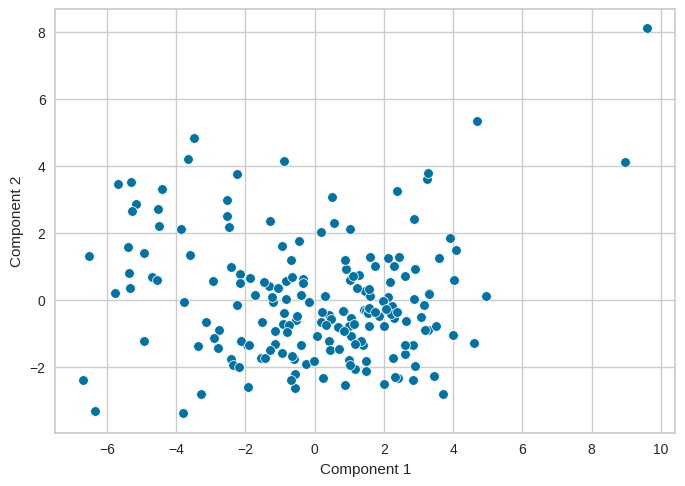

In [ ]:
sns.scatterplot(data=reduced_data_df_pca, x="Component 1", y="Component 2")

<Axes: xlabel='Component 1', ylabel='Component 2'>

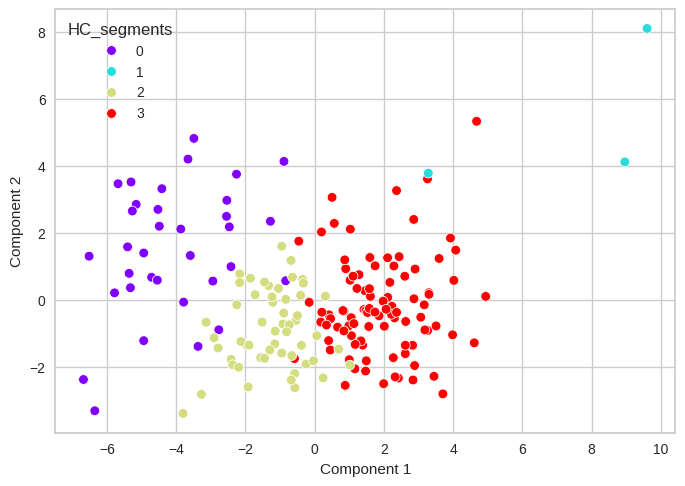

In [ ]:
sns.scatterplot(
    data=reduced_data_df_pca,
    x="Component 1",
    y="Component 2",
    hue=hc_df["HC_segments"],
    palette="rainbow",
)

- Other than Cluster 1, which has only 3 countries, the clusters are pretty well separated.